# Template of  jupyter notebook for analysis of SAXS/WAXS/GiSAXS/GiWAXS

## Load package

In [1]:
%matplotlib notebook
#%matplotlib inline
from pyScatt.packages import *
plt.rcParams.update({'figure.max_open_warning': 0})
plt.rcParams.update({ 'image.origin': 'lower'   })
plt.rcParams.update({ 'image.interpolation': 'none'   })
T = True
F = False

## Define IO

In [2]:
inDir =  '/home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/ExampleData/1M/'
print('The input dir is: %s'%inDir)

The input dir is: /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/ExampleData/1M/


In [3]:
outDir = '/home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/'
#outDir = '/home/yuzhang/Results/'
outDir = create_fullpath(  outDir )
outDir_HDF =  create_dir(  'HDF_Results/', outDir )
outDir_PDF =  create_dir(  'PDF_Report/', outDir )

Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/  already exists
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/HDF_Results/  already exists
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/PDF_Report/  already exists


## Organize Data 
* the sorting method heavly relies on data acquisition strategy
* Currently, there is no general method for sorting

In [4]:
username = 'SYang'
username_short = 'SYang'
username_short = ''
#flist = ls_dir( inDir, and_list=[  username_,  ], no_list=[ 'Cell' ])
flist = ls_dir( inDir, and_list=[ username_short , 'deg'  ], or_list = [ ])
#_, flists = sort_fnlist( flist,  cut_beg = -24, cut_end=-9, method = 'cut_from_end' ) #for waxs
flists = sorted( flist )
#flists_clean = drop_xyz_float_filenames( flists, pattern_characters = ['_x', '_y', '_z', '_w' ] )
flists_clean = flists 
Nf = len( flists)
print('There are %s files for user: %s in this run.'%(Nf, username_short))

There are 9 files for user:  in this run.


In [5]:
flist

array(['SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463_x13300.00_y6795.30_z6795.30_det5000.00m_expt1s_sid00008915_000001_SAXS.tif',
       'SSY_Au_LC3_0.1500deg_ts2021-10-30-05-37-13_dt465_x13300.07_y6795.30_z6795.30_det5000.00m_expt1s_sid00008916_000001_SAXS.tif',
       'SSY_Au_LC3_0.3000deg_ts2021-10-30-05-37-13_dt455_x11299.87_y6795.33_z6795.33_det5000.00m_expt1s_sid00008911_000001_SAXS.tif',
       'SSY_Au_LC4_0.0500deg_ts2021-10-30-05-54-10_dt1283_x29300.00_y6689.94_z6689.94_det5000.00m_expt1s_sid00009076_000001_SAXS.tif',
       'SSY_Au_LC4_0.1500deg_ts2021-10-30-05-37-13_dt615_x29299.93_y6707.39_z6707.39_det5000.00m_expt1s_sid00008924_000001_SAXS.tif',
       'SSY_Au_LC4_0.3000deg_ts2021-10-30-05-54-10_dt1287_x29299.90_y6689.94_z6689.94_det5000.00m_expt1s_sid00009078_000001_SAXS.tif',
       'SSY_Pt-Fe3O4-15h-Si-1_0.0500deg_ts2021-10-31-07-04-32_dt679_x13000.00_y377.69_z377.69_det5000.00m_expt1s_sid00016309_000001_SAXS.tif',
       'SSY_Pt-Fe3O4-15h-Si-1_0.3000deg_ts2021-10-3

In [6]:
flists_clean

['SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463_x13300.00_y6795.30_z6795.30_det5000.00m_expt1s_sid00008915_000001_SAXS.tif',
 'SSY_Au_LC3_0.1500deg_ts2021-10-30-05-37-13_dt465_x13300.07_y6795.30_z6795.30_det5000.00m_expt1s_sid00008916_000001_SAXS.tif',
 'SSY_Au_LC3_0.3000deg_ts2021-10-30-05-37-13_dt455_x11299.87_y6795.33_z6795.33_det5000.00m_expt1s_sid00008911_000001_SAXS.tif',
 'SSY_Au_LC4_0.0500deg_ts2021-10-30-05-54-10_dt1283_x29300.00_y6689.94_z6689.94_det5000.00m_expt1s_sid00009076_000001_SAXS.tif',
 'SSY_Au_LC4_0.1500deg_ts2021-10-30-05-37-13_dt615_x29299.93_y6707.39_z6707.39_det5000.00m_expt1s_sid00008924_000001_SAXS.tif',
 'SSY_Au_LC4_0.3000deg_ts2021-10-30-05-54-10_dt1287_x29299.90_y6689.94_z6689.94_det5000.00m_expt1s_sid00009078_000001_SAXS.tif',
 'SSY_Pt-Fe3O4-15h-Si-1_0.0500deg_ts2021-10-31-07-04-32_dt679_x13000.00_y377.69_z377.69_det5000.00m_expt1s_sid00016309_000001_SAXS.tif',
 'SSY_Pt-Fe3O4-15h-Si-1_0.3000deg_ts2021-10-31-07-57-45_dt299_x11999.87_y372.87_z372.87_det50

### Using  layered dict to sort the files 

In [7]:
#%run -i /home/yuzhang/Software/pyScatt/pyScatt/generic_functions.py

In [8]:
#cut_pattern= r'(_waxs)'
#cut_pattern= r'(deg)'
#cut_pattern= r'[_](\d+)[.](\d+)(deg)[_]'
#cut_pattern = None #r'_'
cut_pattern = r'_x'
sam_dict, sams = get_Unique_SamDict_from_list( flists, sam_list_clean=flists_clean, 
                                               cut_pattern= cut_pattern, starting_point=  0     )   
#ks =  sorted(list(sams.keys()))
ks =   list(sams.keys())
N = len(ks)
print( 'There are %s samples.'%(N))

There are 9 samples.


In [9]:
sams

{'SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463': 1,
 'SSY_Au_LC3_0.1500deg_ts2021-10-30-05-37-13_dt465': 1,
 'SSY_Au_LC3_0.3000deg_ts2021-10-30-05-37-13_dt455': 1,
 'SSY_Au_LC4_0.0500deg_ts2021-10-30-05-54-10_dt1283': 1,
 'SSY_Au_LC4_0.1500deg_ts2021-10-30-05-37-13_dt615': 1,
 'SSY_Au_LC4_0.3000deg_ts2021-10-30-05-54-10_dt1287': 1,
 'SSY_Pt-Fe3O4-15h-Si-1_0.0500deg_ts2021-10-31-07-04-32_dt679': 1,
 'SSY_Pt-Fe3O4-15h-Si-1_0.3000deg_ts2021-10-31-07-57-45_dt299': 1,
 'SSY_Pt-Fe3O4-15h-Si-3_0.1500deg_ts2021-10-31-12-23-37_dt2004': 1}

In [10]:
ks[0], sam_dict[ks[0]]

('SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463',
 ['SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463_x13300.00_y6795.30_z6795.30_det5000.00m_expt1s_sid00008915_000001_SAXS.tif'])

##  Load Mask if has one

<IPython.core.display.Javascript object>


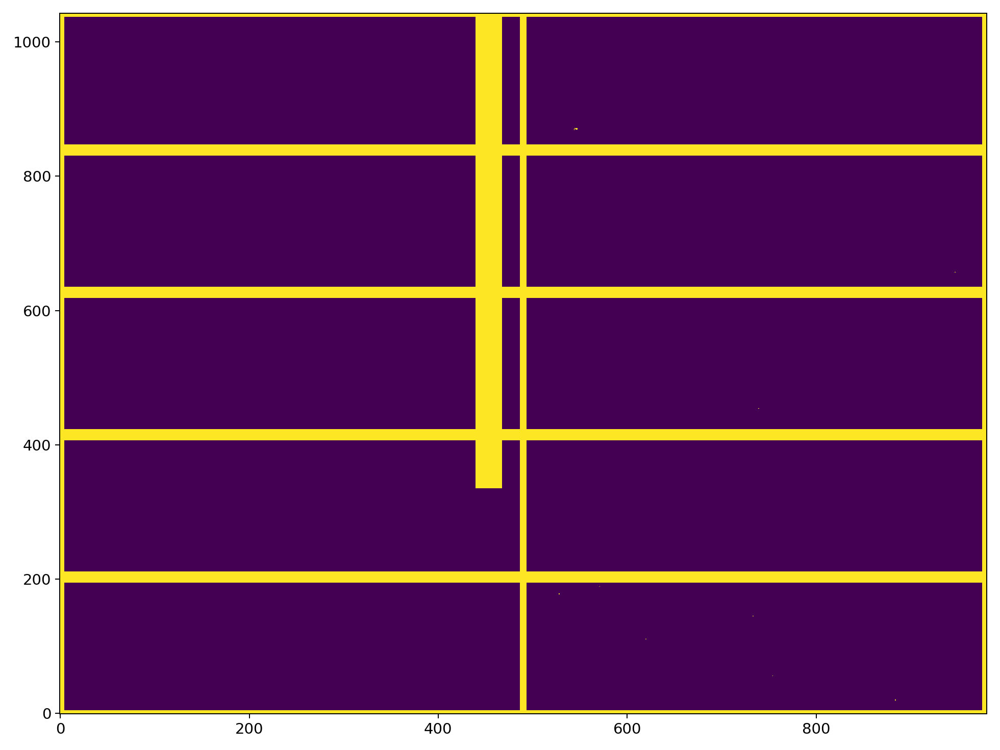

In [11]:
mask  =np.load( '/home/group/NSLSII_Data/SMI/2021_Cycle3/Mask/mask_saxs_2021_C3_Nov5000.npy')
show_img(mask)

## Define data analysis parameters and methods

### A GiSAXS

In [12]:

beamline = 'SMI'
cycle='2021_C3'


geometry   =  'Reflection'
det_str =  'Pilatus1m'

wav_m = 1E-10 * (12.398/16.1)
sdd_mm = 5000.00


b_xy =   [454, 682]
bs_xy = [ 454, 336 ]
sdd_mm = 5000 


 
incident_angle = 0
hotpixel_thres = 1e6
  
pargs_sc = dict( wav_m = wav_m, 
                sdd_mm = sdd_mm, 
                b_xy =b_xy, 
                bs_xy = bs_xy, 
                incident_angle = incident_angle,             
                det_str = det_str, 
                bs_kind = None, 
                useqx = True,
                geometry =  geometry,                
                username = username, 
                cycle =  cycle, 
                beamline = beamline, 
                outDir = outDir, )
              # mask = mask )
   
## Setup the class
SC = SMI_Scattering( pargs_sc  )
 


### Methods

In [13]:
do_plot = T #True 
#do_inpait = True, make it True, the circular average does not use inpaited data 
do_show_plot = T
save_raw = F
do_qimg = F
do_ciravg = F
save_raw= F
check_stitch = F
do_stitch = F
do_Qciravg = F
show_Qciravg_roi = F 
do_Qciravg_sector = F   
show_Qciravg_sector = F 
do_Qqphi = F 
do_q_qphi = F
do_p_qphi = F  


if T:    
    ###########################
    #for GiSAXS
    ###########################  
    do_plot_raw = T # True
    do_qimg = T
    
    #do_ciravg = T #False  #True  
    do_Qciravg = T #T #T  
    
    do_linecut_qz = F #do qz-linecut, if qz_cuts is none, make cut at Yoneda wing
    qz_cuts= None # [0.04, 0.08, 0.15 ]
    q_wid = 0.0025  
    ang_ctl = 0.112  #for Si wafer at 16.1 keV 
    show_linecut_qz =   F
    do_linecut_qr = F #do qx-linecut
    qr_cuts= None # [0.04, 0.08, 0.15 ]
    show_linecut_qr =   F   
    
    
    
 
    

In [14]:
#sample_list = ks[ : 1 ]
sample_list = ks   #use a dummy papemill to run this
print( sample_list[0], sam_dict[sample_list[0]]  )

SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463 ['SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463_x13300.00_y6795.30_z6795.30_det5000.00m_expt1s_sid00008915_000001_SAXS.tif']


In [15]:
#plt.ioff()  #Turn off the plots
#plt.ion()  #Turn on the plots

# Run the data analysis

The sample is: SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463.
The filelist for this sample is: ['SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463_x13300.00_y6795.30_z6795.30_det5000.00m_expt1s_sid00008915_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.05.


<IPython.core.display.Javascript object>


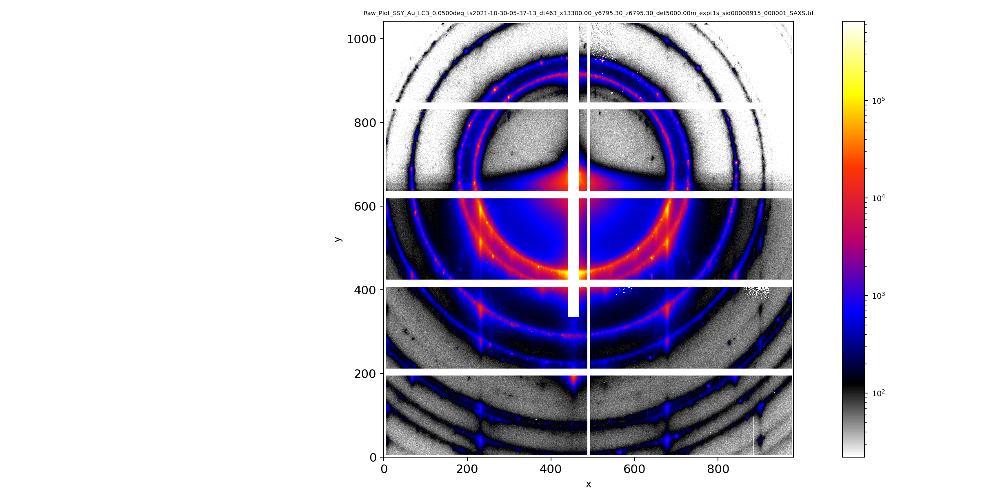

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


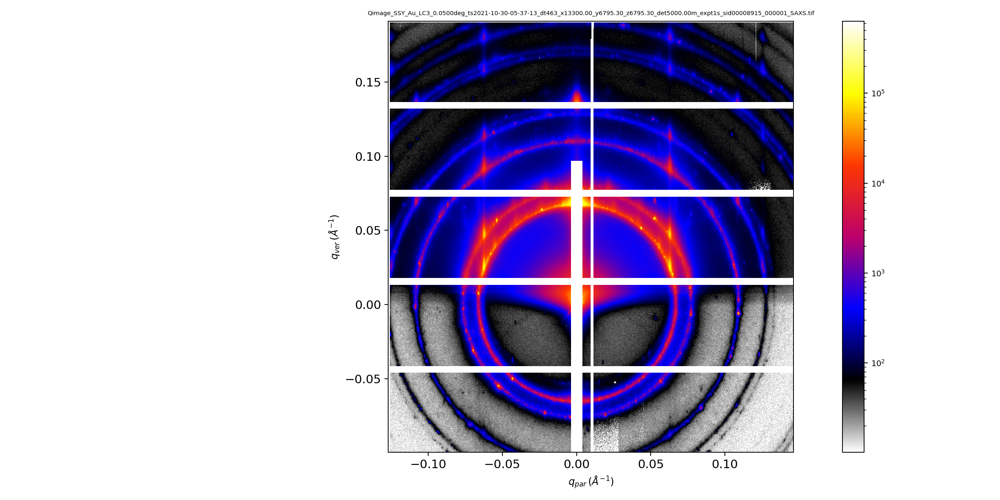

The file: Cir_Avg_SSY_Au_LC3_0.0500deg_ts2021-10-30-05-37-13_dt463.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


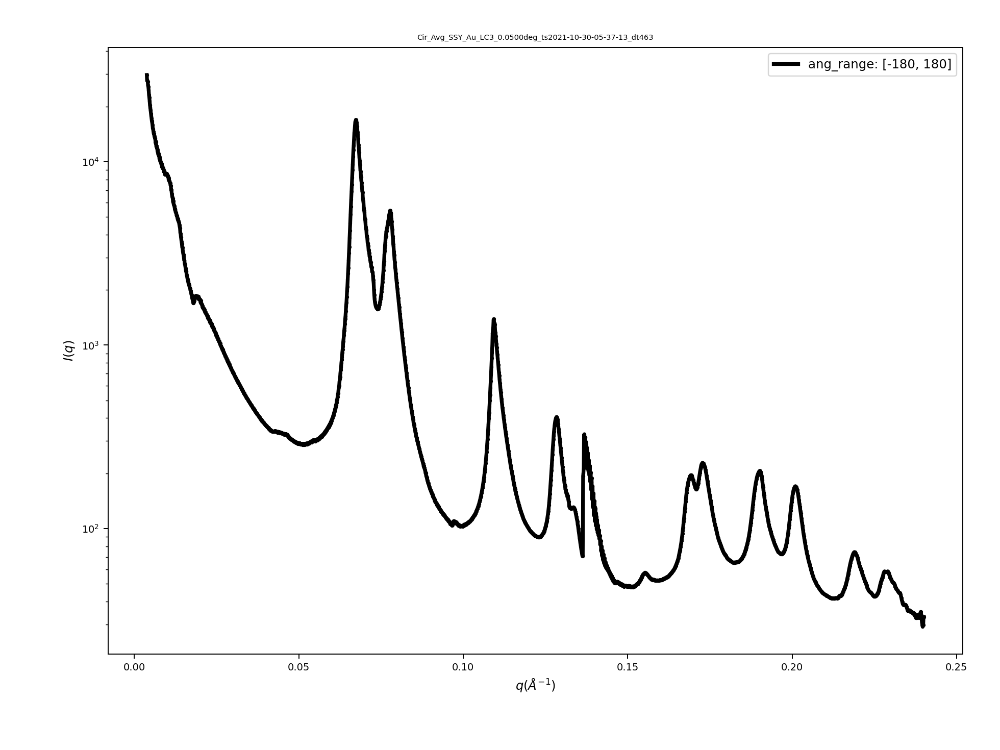

ylim is: None.
The sample is: SSY_Au_LC3_0.1500deg_ts2021-10-30-05-37-13_dt465.
The filelist for this sample is: ['SSY_Au_LC3_0.1500deg_ts2021-10-30-05-37-13_dt465_x13300.07_y6795.30_z6795.30_det5000.00m_expt1s_sid00008916_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.15.


<IPython.core.display.Javascript object>


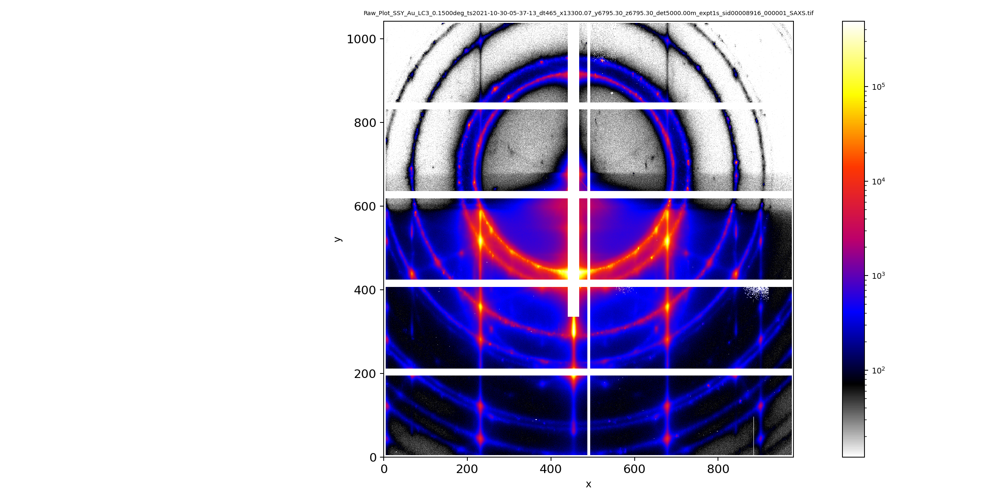

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


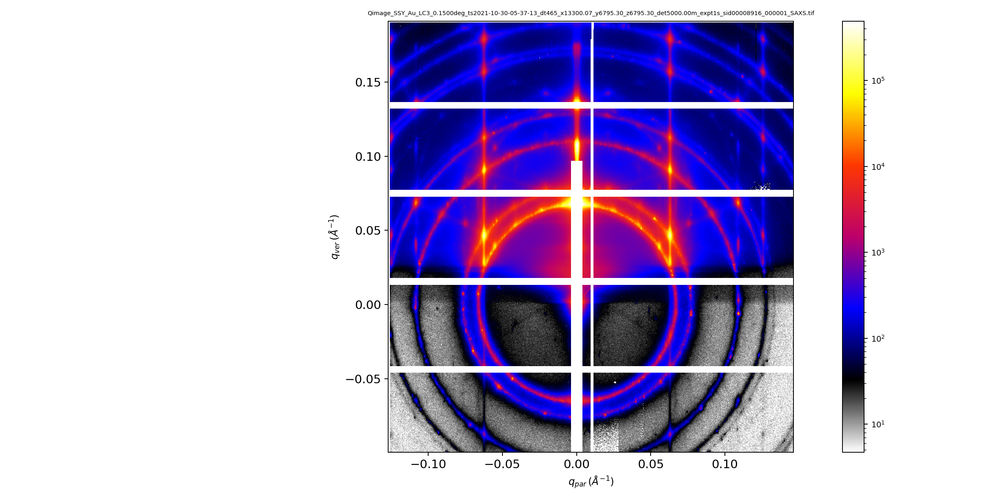

The file: Cir_Avg_SSY_Au_LC3_0.1500deg_ts2021-10-30-05-37-13_dt465.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


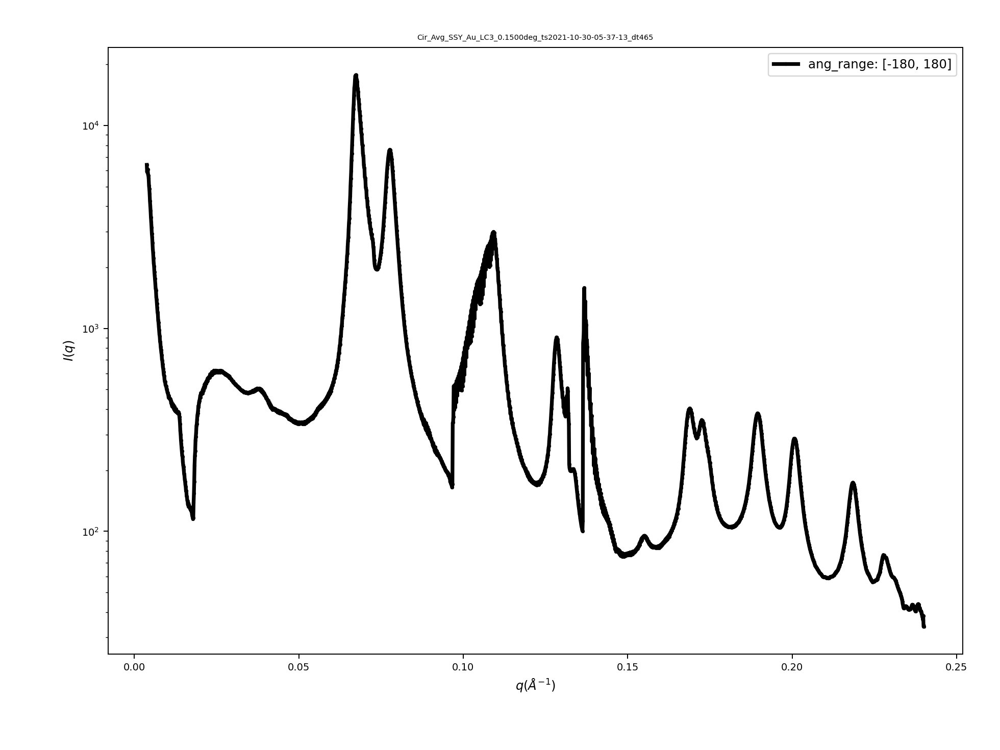

ylim is: None.
The sample is: SSY_Au_LC3_0.3000deg_ts2021-10-30-05-37-13_dt455.
The filelist for this sample is: ['SSY_Au_LC3_0.3000deg_ts2021-10-30-05-37-13_dt455_x11299.87_y6795.33_z6795.33_det5000.00m_expt1s_sid00008911_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.3.


<IPython.core.display.Javascript object>


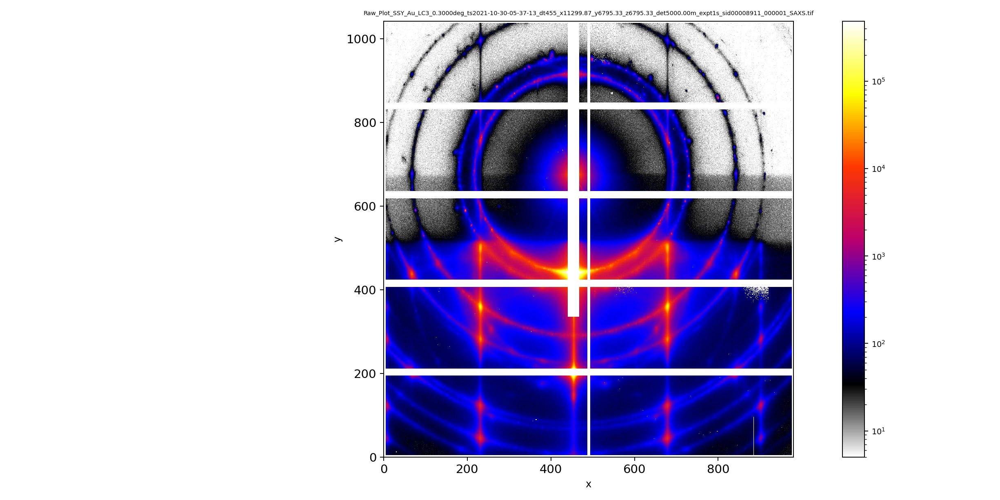

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


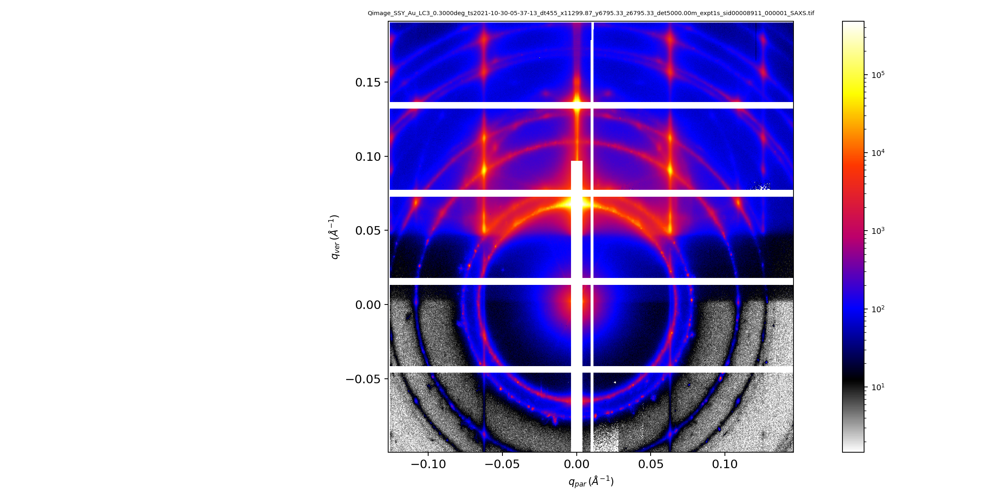

The file: Cir_Avg_SSY_Au_LC3_0.3000deg_ts2021-10-30-05-37-13_dt455.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


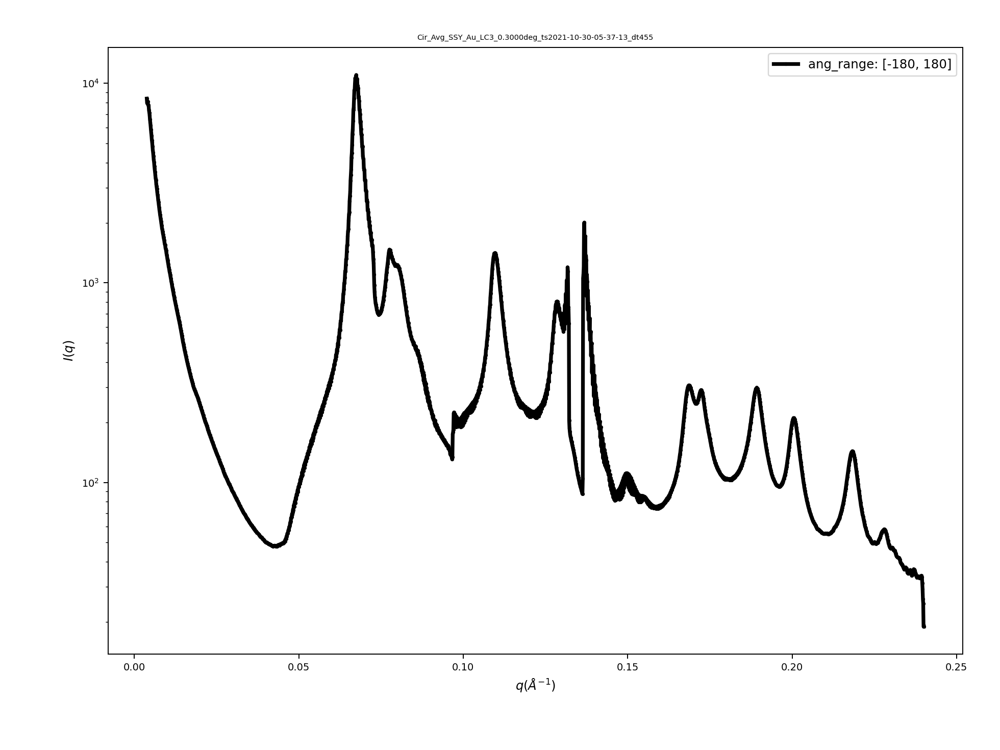

ylim is: None.
The sample is: SSY_Au_LC4_0.0500deg_ts2021-10-30-05-54-10_dt1283.
The filelist for this sample is: ['SSY_Au_LC4_0.0500deg_ts2021-10-30-05-54-10_dt1283_x29300.00_y6689.94_z6689.94_det5000.00m_expt1s_sid00009076_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.05.


<IPython.core.display.Javascript object>


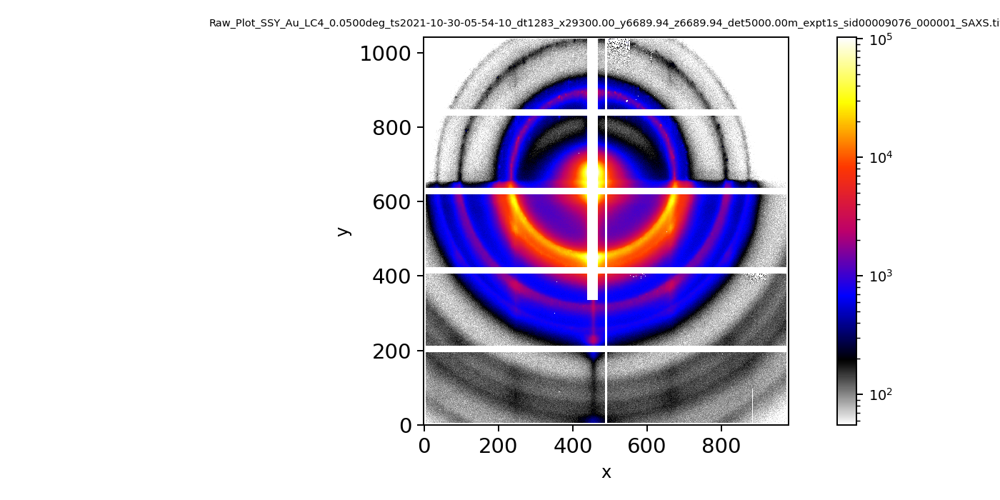

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


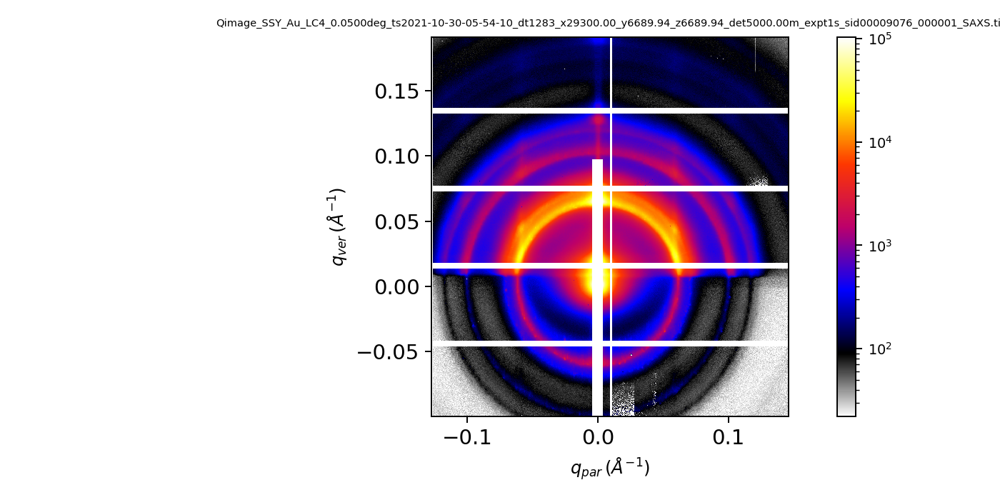

The file: Cir_Avg_SSY_Au_LC4_0.0500deg_ts2021-10-30-05-54-10_dt1283.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


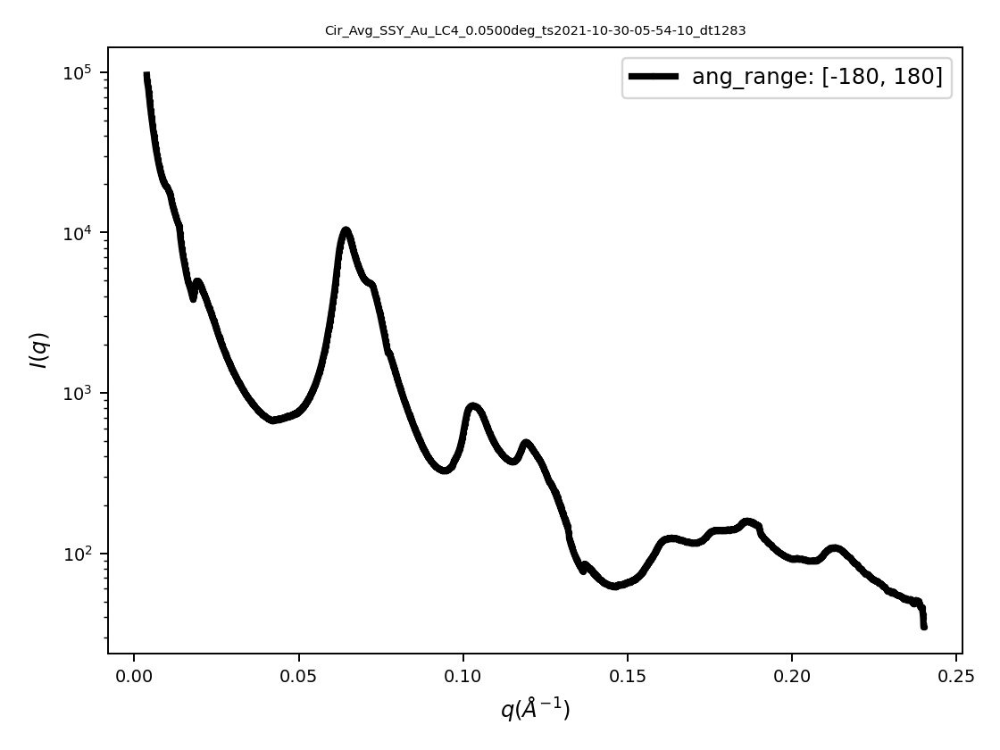

ylim is: None.
The sample is: SSY_Au_LC4_0.1500deg_ts2021-10-30-05-37-13_dt615.
The filelist for this sample is: ['SSY_Au_LC4_0.1500deg_ts2021-10-30-05-37-13_dt615_x29299.93_y6707.39_z6707.39_det5000.00m_expt1s_sid00008924_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.15.


<IPython.core.display.Javascript object>


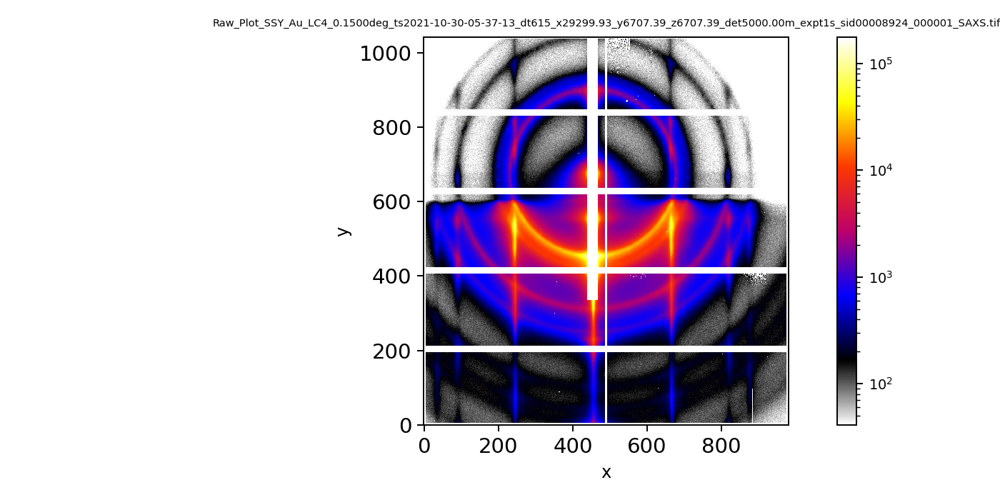

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


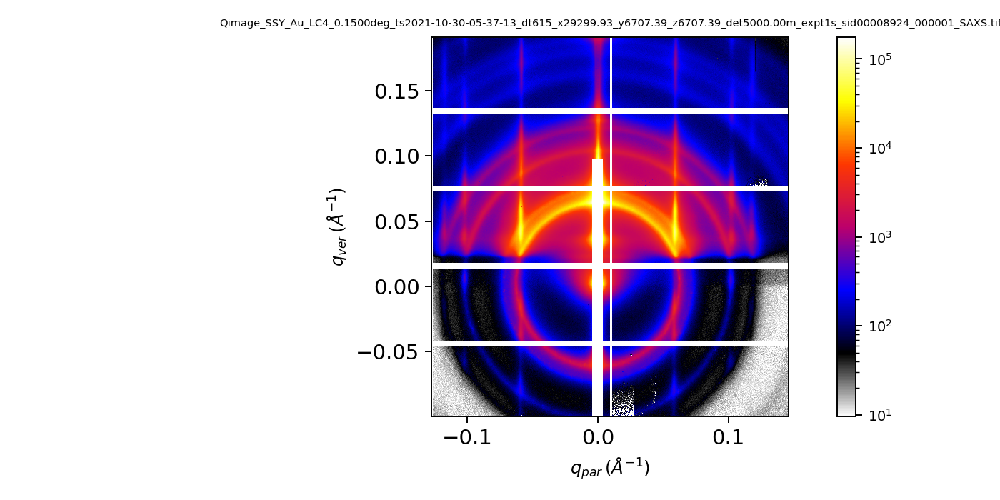

The file: Cir_Avg_SSY_Au_LC4_0.1500deg_ts2021-10-30-05-37-13_dt615.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


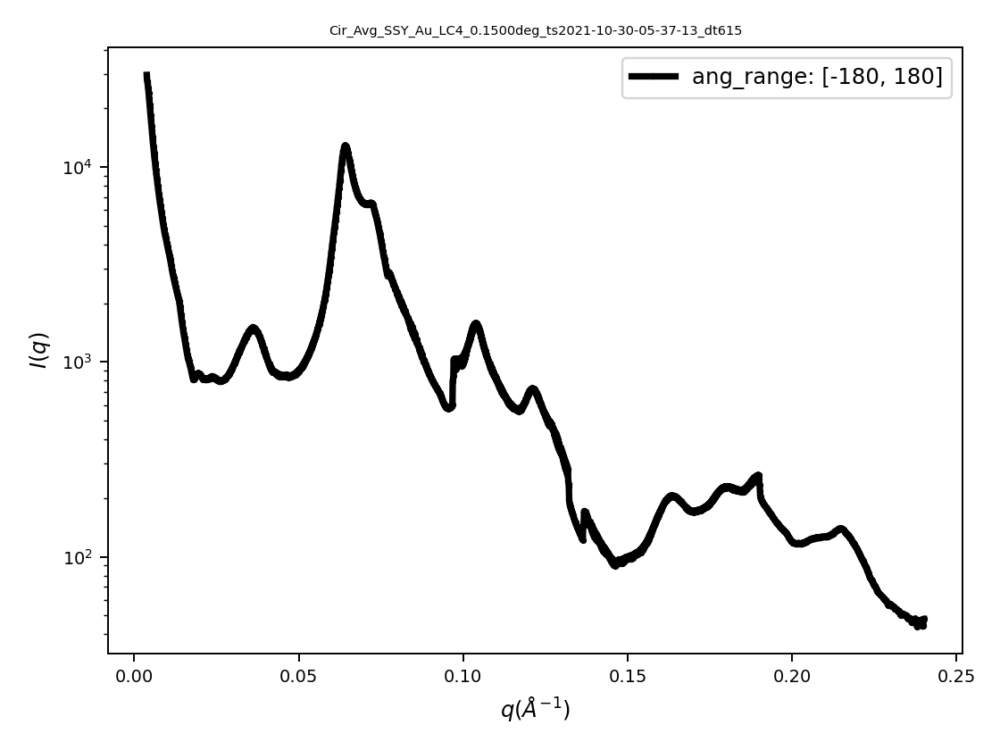

ylim is: None.
The sample is: SSY_Au_LC4_0.3000deg_ts2021-10-30-05-54-10_dt1287.
The filelist for this sample is: ['SSY_Au_LC4_0.3000deg_ts2021-10-30-05-54-10_dt1287_x29299.90_y6689.94_z6689.94_det5000.00m_expt1s_sid00009078_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.3.


<IPython.core.display.Javascript object>


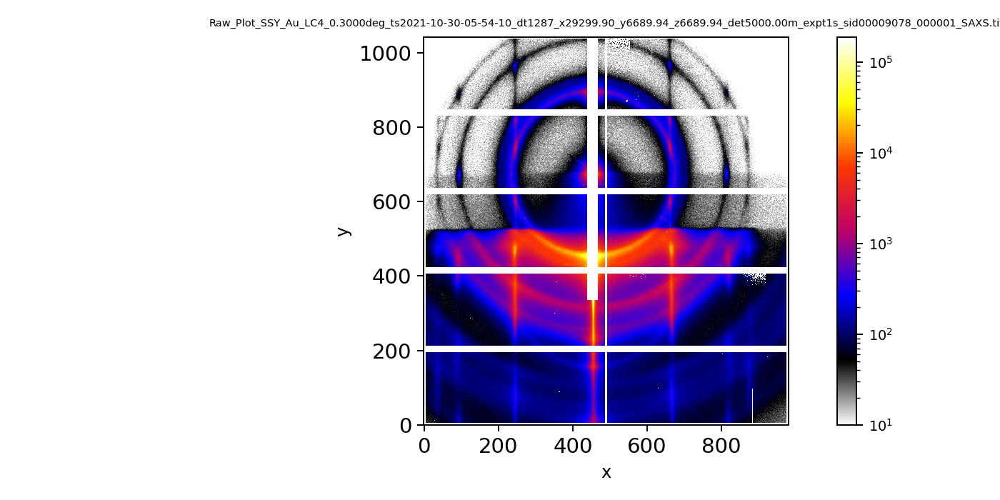

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


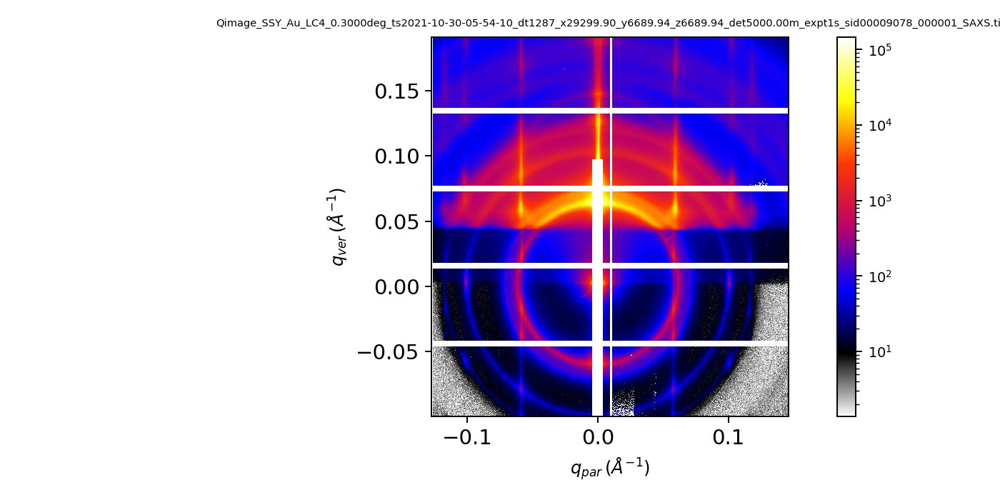

The file: Cir_Avg_SSY_Au_LC4_0.3000deg_ts2021-10-30-05-54-10_dt1287.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


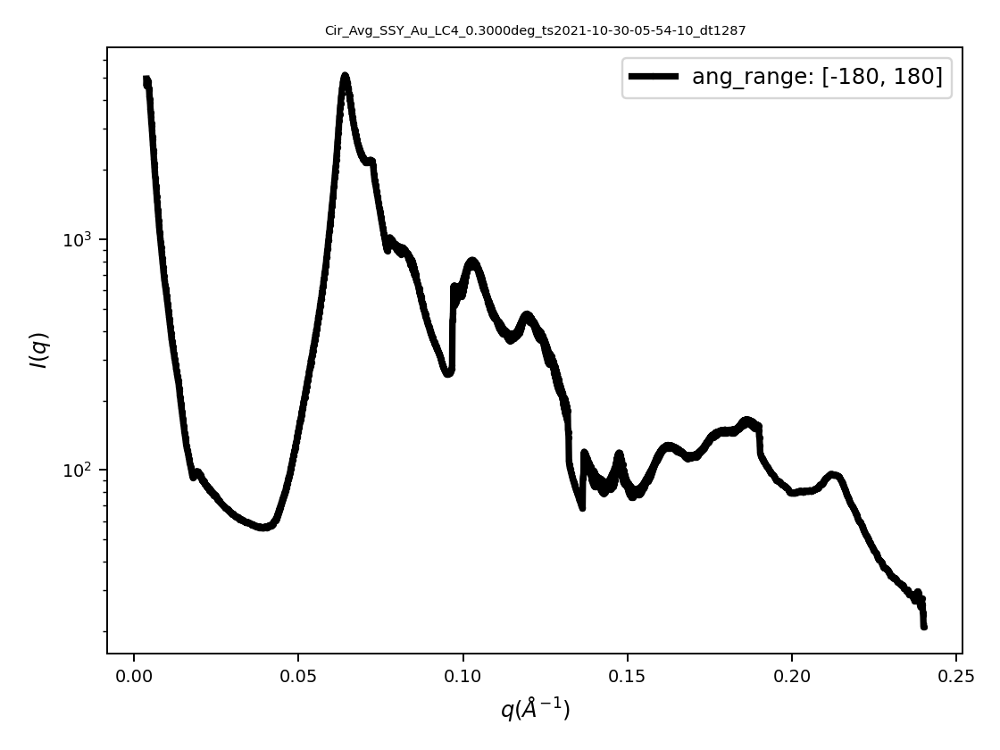

ylim is: None.
The sample is: SSY_Pt-Fe3O4-15h-Si-1_0.0500deg_ts2021-10-31-07-04-32_dt679.
The filelist for this sample is: ['SSY_Pt-Fe3O4-15h-Si-1_0.0500deg_ts2021-10-31-07-04-32_dt679_x13000.00_y377.69_z377.69_det5000.00m_expt1s_sid00016309_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.05.


<IPython.core.display.Javascript object>


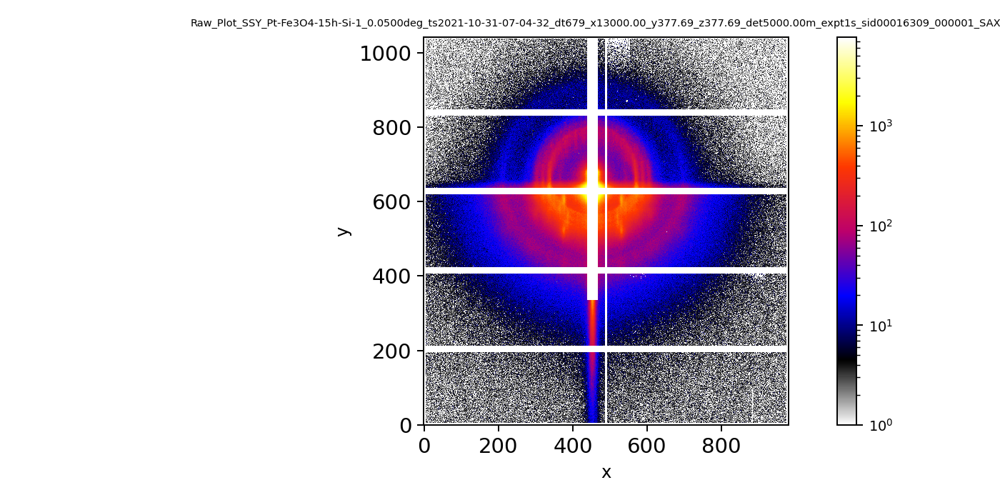

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


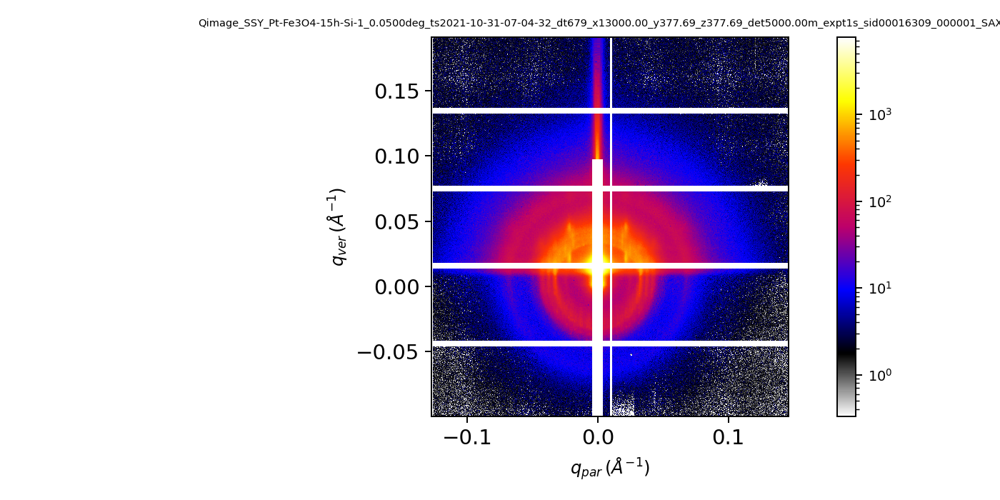

The file: Cir_Avg_SSY_Pt-Fe3O4-15h-Si-1_0.0500deg_ts2021-10-31-07-04-32_dt679.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


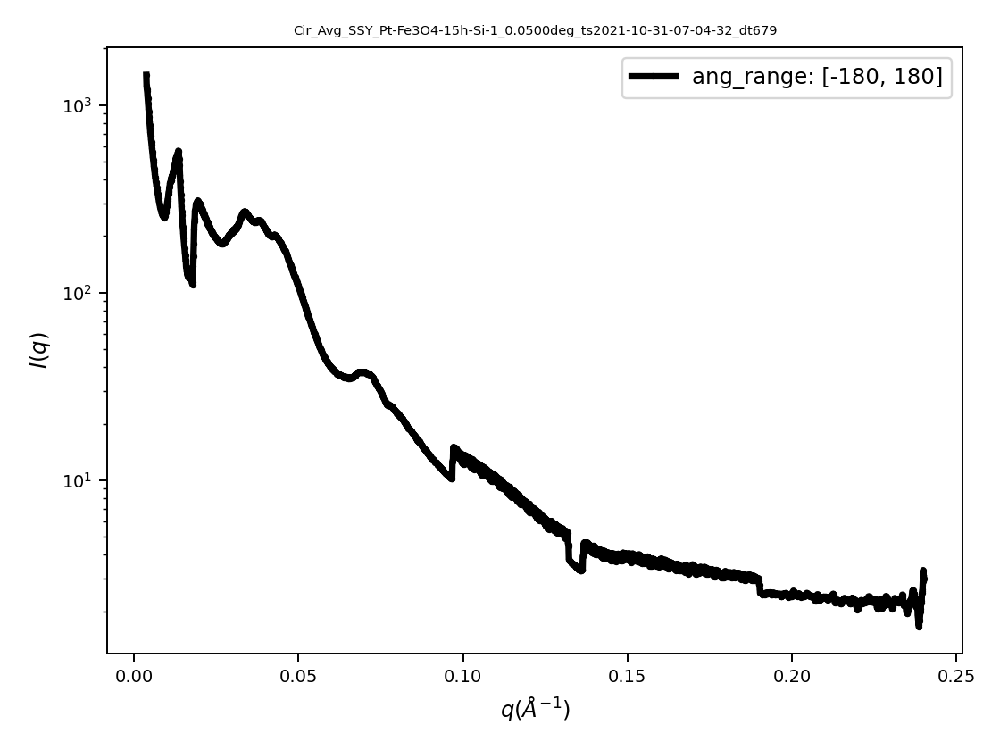

ylim is: None.
The sample is: SSY_Pt-Fe3O4-15h-Si-1_0.3000deg_ts2021-10-31-07-57-45_dt299.
The filelist for this sample is: ['SSY_Pt-Fe3O4-15h-Si-1_0.3000deg_ts2021-10-31-07-57-45_dt299_x11999.87_y372.87_z372.87_det5000.00m_expt1s_sid00016638_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.3.


<IPython.core.display.Javascript object>


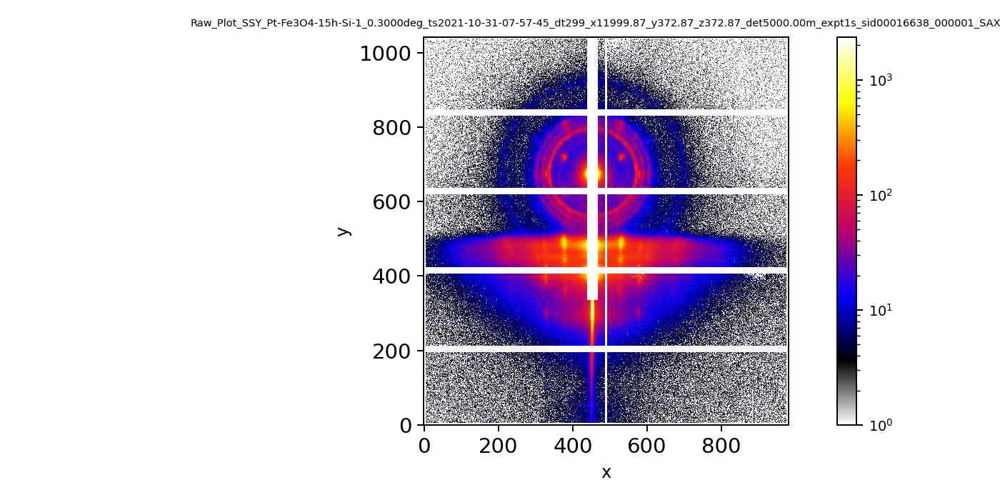

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


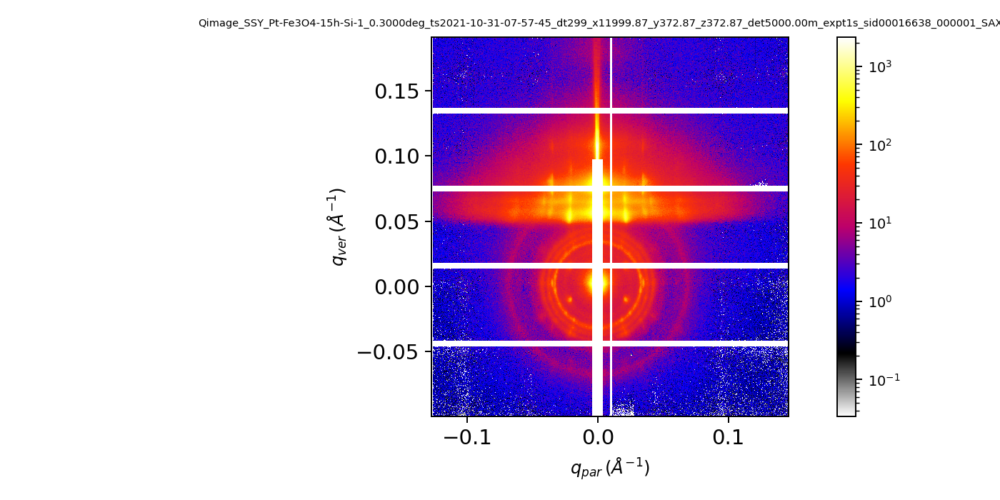

The file: Cir_Avg_SSY_Pt-Fe3O4-15h-Si-1_0.3000deg_ts2021-10-31-07-57-45_dt299.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


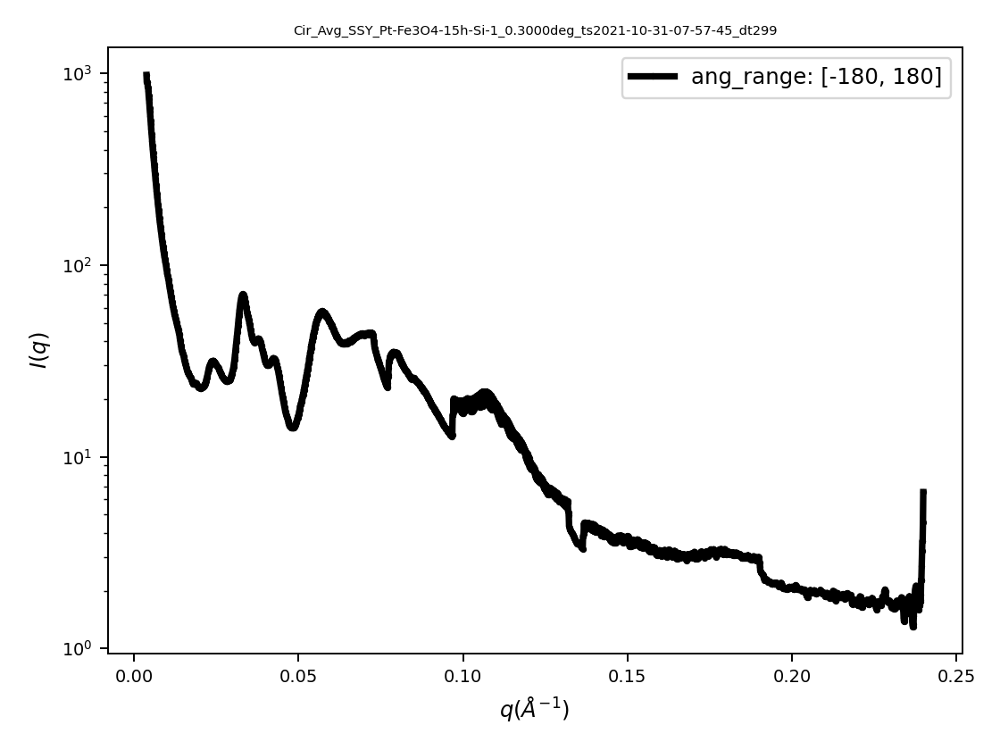

ylim is: None.
The sample is: SSY_Pt-Fe3O4-15h-Si-3_0.1500deg_ts2021-10-31-12-23-37_dt2004.
The filelist for this sample is: ['SSY_Pt-Fe3O4-15h-Si-3_0.1500deg_ts2021-10-31-12-23-37_dt2004_x13000.05_y370.34_z370.34_det5000.00m_expt1s_sid00019022_000001_SAXS.tif'].
Directory  /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/  already exists
The incident angle is: 0.15.


<IPython.core.display.Javascript object>


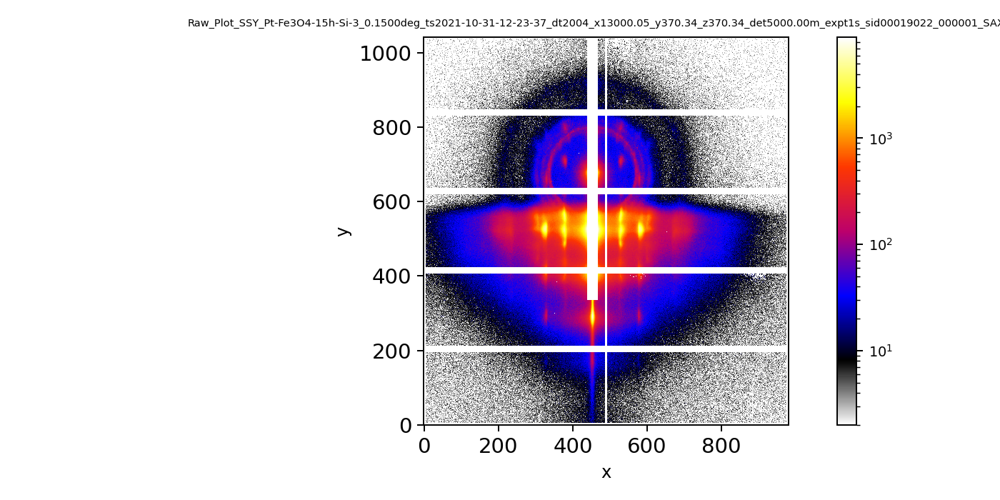

/home/group/Software/pyScatt/pyScatt/plots.py:93: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


<IPython.core.display.Javascript object>


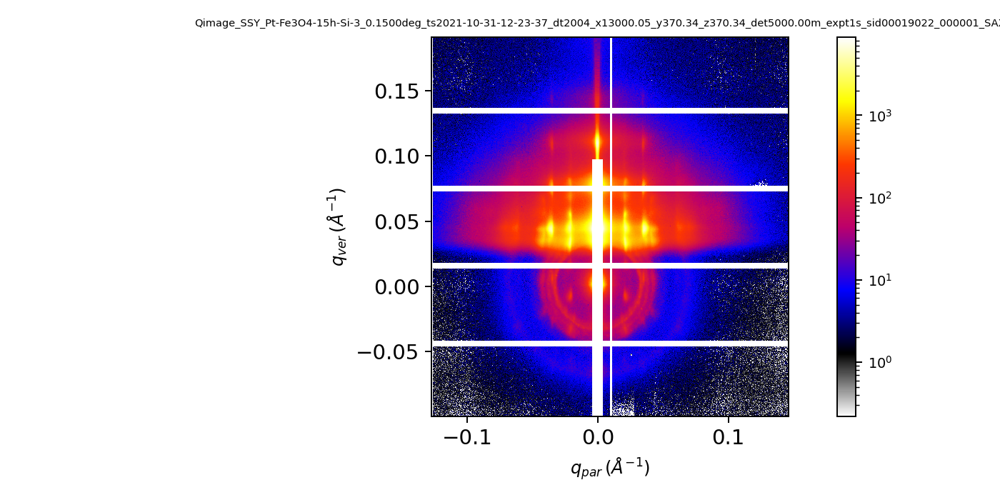

The file: Cir_Avg_SSY_Pt-Fe3O4-15h-Si-3_0.1500deg_ts2021-10-31-12-23-37_dt2004.csv is saved in /home/group/NSLSII_Data/SMI/2021_Cycle3/Results/SYang/GISAXS/Cir_Avg/


<IPython.core.display.Javascript object>


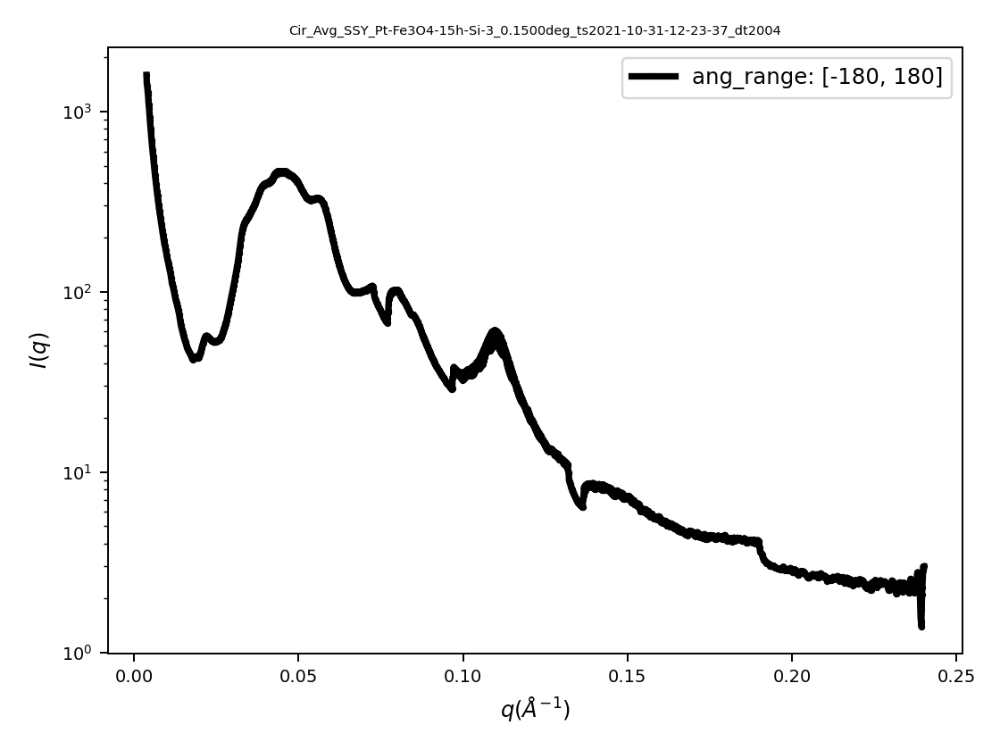

ylim is: None.
Done


In [16]:
#loop samples
for sam in sample_list:     
    print( 'The sample is: %s.'%sam) 
    fps = sam_dict[sam] 
    fp = fps[0]
    print( 'The filelist for this sample is: %s.'%fps)     
    full_filenames = [ inDir +  fp for fp in fps   ]   # [:1]
    N =  len(full_filenames)        
    RES = {}
    PATH = 'GISAXS'
    RES['Data'] = {}
    pargs_sc['outDir'] = create_fullpath( outDir + PATH + '/')          
    try:
        #pz = float( re.search(   r'(_z)(.*)()', sam ).group()[2:]  )
        pz = float( re.search(   r'(_z)(.*)()', fp ).group()[2:]  )
    except:
        #pz = 1400
        pz = 0
    pargs_sc['sdd_mm'] = sdd_mm  - pz/1000.      
    #p0 = re.search( r'([d][e][g])', sam  ).span()[0]
    #inc = float( sam[ p0-6:p0] )
    p0 = re.search( r'([d][e][g])', fp  ).span()[0]
    inc = float( fp[ p0-6:p0] )
    print('The incident angle is: %s.'%inc)
    pargs_sc['incident_angle'] = inc  
    SC = SMI_Scattering( pargs_sc  ) 
    SC.md['sample'] = sam
    SC.load_data( full_filenames )   
    SC.saved_plots, SC.saved_data  = {}, {}   
    for i in range(N):
        res = {}
        #######################################
        #plot the raw data
        ########################################
        if do_plot_raw:
            run_plot_raw( SC, ki=i,  vmin= None, vmax=None,mask=~mask, fontsize=6, )  
        #######################################
        #Do conversion to q-space
        ########################################              
        if do_qimg:
            qimg, qx, qz = SC.img_to_qimg( img = SC.imgs[i], bins=None,mask= mask, x='Qr', y='Qz', method = 'ai'  )            
            run_save_qimage(  SC, ki=i  )  
            run_plot_qimage(  SC, ki=i , zlim=[0.1,1] )  
            SC.qmask = ~SC.qimg_mask
            
            
        #######################################
        #Do circular average
        ########################################  
        if do_Qciravg: 
            #qz_roi_range= [ 0.05, 1.2 ] 
            qz_roi_range= None
            #Prange= [0,180]
            Prange= [-180,180]
            qmaskn, q_ca,iq_ca,mask_ca = run_qciravg( SC, ciravg_bins=2500, Prange= Prange, Qrange= None,
                               qx_roi_range=None,qz_roi_range=qz_roi_range, dtype='qimg',     )
            run_save_ciravg(  SC   )  
            peaks = None #2*np.pi/dis_AlO   #None 
            run_plot_ciravg( SC, peaks = peaks,xlim= None, ylim=None,fontsize=6, )  
            if show_Qciravg_roi:
                run_plot_qciravg_roi( SC,img_roi=SC.qimg_st*mask_ca,vmin=None,vmax=None,
                                     fontsize=6,  zlim=[.4, 1 - 1e-5] )              
            
            
        #######################################
        # Do hor-linecut  ( cut at onstant qz)
        ########################################             
        if do_linecut_qz:
            if qz_cuts is None:
                qYo = round(  4*np.pi/(wav_m * 1e10) * np.deg2rad(   (ang_ctl + float(inc) )/2   ), 4 )
                SC.md['qYoneda'] = qYo 
                qz_cuts=[ qYo  ]
            qiqs_lcqz = SC.qimg_linecut_qzs( qimg , qx_range=qx, qz_range=qz,
                                  qz_cuts=qz_cuts, qz_wid=q_wid,Qrange=[qx.min(), qx.max()], mask= ~SC.qimg_mask  )  
            run_save_linecuts( SC, ki=None, dtype = 'Linecut_Hor'  ) 
            run_plot_linecuts( SC, ki=None, dtype = 'Linecut_Hor'  )
            if show_linecut_qz:
                run_plot_img_with_linecuts( SC,  ki=None, zlim=[0.1,1], dtype = 'Linecut_Hor'  )
        #######################################
        # Do ver-linecut  ( cut at onstant qr)
        ########################################             
        if do_linecut_qr:
            if qr_cuts is None:
                qYo = round(  4*np.pi/(wav_m * 1e10) * np.deg2rad(   (ang_ctl + float(inc) )/2   ), 4 )
                SC.md['qYoneda'] = qYo 
                qr_cuts=[ qYo  ] 
            qiqs_lcqx = SC.qimg_linecut_qxs( qimg , qx_range=qx, qz_range=qz,
                         qx_cuts=[ qYo  ],qx_wid=q_wid,Prange=[qz.min(), qz.max()], mask= ~SC.qimg_mask  )  
            run_save_linecuts( SC, ki=None, dtype = 'Linecut_Ver'  ) 
            run_plot_linecuts( SC, ki=None, dtype = 'Linecut_Ver'  ) 
            if show_linecut_qr:
                run_plot_img_with_linecuts( SC,  ki=None, zlim=[0.1,1], dtype = 'Linecut_Ver'  )     
       ## save data to h5 file 
        res = SC.res_to_dict( save_raw=save_raw, do_qimg=do_qimg, do_linecut_qz =do_linecut_qz,
                          do_linecut_qx=do_linecut_qr,  do_ciravg = do_Qciravg     )  
        RES['Data'][ SC.md['filenames'][i] ] = res 
 
    K='saved_data';SC.md[K] = SC.saved_data
    K='saved_plots';SC.md[K] = SC.saved_plots    
    RES['md']= SC.md  
    
    dicttoh5( RES, os.path.join(outDir_HDF, '%s.h5'%sam),
                     h5path='/%s/'%PATH, mode='a', overwrite_data=True)   
    
    
print('Done')                
        
        
        
        
        

# THE END